<a href="https://colab.research.google.com/github/chaidosa/playground/blob/main/playground.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!git clone https://github.com/chaidosa/playground.git

Cloning into 'playground'...
remote: Enumerating objects: 64, done.
remote: Counting objects: 100% (64/64), done.
remote: Compressing objects: 100% (49/49), done.
remote: Total 64 (delta 14), reused 61 (delta 14), pack-reused 0
Unpacking objects: 100% (64/64), 81.22 KiB | 4.06 MiB/s, done.


In [ ]:
!ls

playground  sample_data


In [ ]:
%cd playground

/content/playground


In [ ]:
%cd pointnet2

/content/playground/pointnet2


In [ ]:
!ls

_ext-src  __init__.py  __pycache__  setup.py  utils


In [ ]:
!pip install visdom

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 35.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for visdom: filename=visdom-0.2.4-py3-none-any.whl size=1408196 sha256=30fea951454fd06661fffd1879210e69201da41245ca5b76dfecd43ced2771f2
  Stored in directory: /root/.cache/pip/wheels/42/29/49/5bed207bac4578e4d2c0c5fc0226bfd33a7e2953ea56356855
Successfully built visdom


In [ ]:
%run setup.py build_ext --inplace

INFO:root:running build_ext
/usr/local/lib/python3.10/dist-packages/torch/utils/cpp_extension.py:476: UserWarning: Attempted to use ninja as the BuildExtension backend but we could not find ninja.. Falling back to using the slow distutils backend.
  warnings.warn(msg.format('we could not find ninja.'))
/usr/local/lib/python3.10/dist-packages/torch/utils/cpp_extension.py:398: UserWarning: There are no x86_64-linux-gnu-g++ version bounds defined for CUDA version 11.8
  warnings.warn(f'There are no {compiler_name} version bounds defined for CUDA version {cuda_str_version}')
INFO:root:building '_ext' extension
INFO:root:creating build
INFO:root:creating build/temp.linux-x86_64-cpython-310
INFO:root:creating build/temp.linux-x86_64-cpython-310/_ext-src
INFO:root:creating build/temp.linux-x86_64-cpython-310/_ext-src/src
INFO:root:x86_64-linux-gnu-gcc -pthread -Wno-unused-result -Wsign-compare -DNDEBUG -g -fwrapv -O2 -Wall -g -fstack-protector-strong -Wformat -Werror=format-security -g -fwrap

Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/setuptools/_distutils/unixccompiler.py", line 185, in _compile
    self.spawn(compiler_so + cc_args + [src, '-o', obj] + extra_postargs)
  File "/usr/local/lib/python3.10/dist-packages/setuptools/_distutils/ccompiler.py", line 1041, in spawn
    spawn(cmd, dry_run=self.dry_run, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/setuptools/_distutils/spawn.py", line 70, in spawn
    raise DistutilsExecError(
distutils.errors.DistutilsExecError: command '/usr/bin/x86_64-linux-gnu-gcc' failed with exit code 1

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/setuptools/_distutils/core.py", line 201, in run_commands
    dist.run_commands()
  File "/usr/local/lib/python3.10/dist-packages/setuptools/_distutils/dist.py", line 969, in run_commands
    self.run_command(cmd)
  File "/usr/local/lib/python3.

TypeError: ignored

In [ ]:
!pip install six

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
import numpy as np

def median_filter(input_array):
    # size of the window
    M = 3
    N = 3

    # dimensions of the input array
    m_input, n_input = input_array.shape

    # output array to store filtered values
    output_array = np.zeros_like(input_array)
    
    # pad the input array with zeros
    padded_array = np.pad(input_array, ((M//2, M//2), (N//2, N//2)))
    print(padded_array)

    for i in range(m_input):
        for j in range(n_input):

            #window from the padded array
            window = padded_array[i:i+M, j:j+N]

            # print(window)

            median = np.median(np.ravel(window))

            
            output_array[i, j] = median

    return output_array


In [ ]:
def modified_median_filter(input_array):
    # size of the window
    M = 3
    N = 3

    # dimensions of the input array
    m_input, n_input = input_array.shape

    # output array to store filtered values
    output_array = np.zeros_like(input_array)
    
    # pad the input array with zeros
    padded_array = np.pad(input_array, ((M//2, M//2), (N//2, N//2)))
    # print(padded_array)

    for i in range(m_input):
        for j in range(n_input):

            #window from the padded array
            window = padded_array[i:i+M, j:j+N]

            # print(window)
            window_flatten = np.ravel(window)
            np.sort(window_flatten)
            print(window_flatten)
            mid = (M * N) // 2
            # print(mid)

            modified_med = (window_flatten[mid] + window_flatten[mid+1] + window_flatten[mid-1]) / 3
            

            
            output_array[i, j] = modified_med

    return output_array


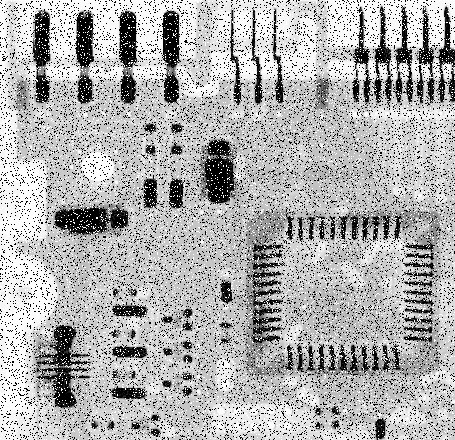

In [ ]:
import cv2
from google.colab.patches import cv2_imshow
image = cv2.imread("t2.jpeg", 0)

cv2_imshow(image)

In [ ]:
modified = median_filter(image)

[[  0   0   0 ...   0   0   0]
 [  0 248   1 ... 255 251   0]
 [  0 254 249 ... 246 248   0]
 ...
 [  0 253 250 ... 203 208   0]
 [  0 247 241 ... 200 209   0]
 [  0   0   0 ...   0   0   0]]


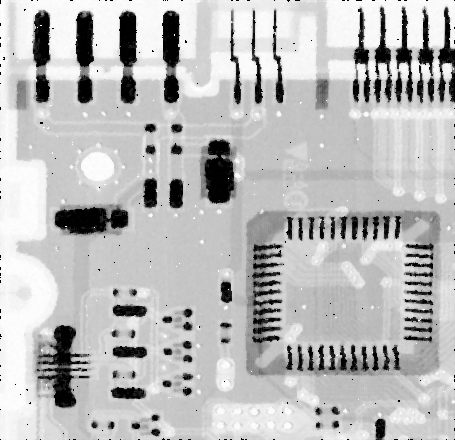

In [ ]:
cv2_imshow(modified)

[  0   0   0   0 248   1   0 254 249]
[  0   0   0 248   1 254 254 249 251]
[  0   0   0   1 254 252 249 251 247]
[  0   0   0 254 252 252 251 247 253]
[  0   0   0 252 252 255 247 253 241]
[  0   0   0 252 255 245 253 241 247]
[  0   0   0 255 245 250 241 247 245]
[  0   0   0 245 250 247 247 245 227]
[  0   0   0 250 247 242 245 227 236]
[  0   0   0 247 242 245 227 236 226]
[  0   0   0 242 245 253 236 226 255]
[  0   0   0 245 253 238 226 255 234]
[  0   0   0 253 238 245 255 234 247]
[  0   0   0 238 245 255 234 247 237]
[  0   0   0 245 255 247 247 237 233]
[  0   0   0 255 247 246 237 233 247]
[  0   0   0 247 246 254 233 247 241]
[  0   0   0 246 254 245 247 241 249]
[  0   0   0 254 245 255 241 249 243]
[  0   0   0 245 255 253 249 243 244]
[  0   0   0 255 253 250 243 244 255]
[  0   0   0 253 250 253 244 255 250]
[  0   0   0 250 253 250 255 250 246]
[  0   0   0 253 250 250 250 246 248]
[  0   0   0 250 250 255 246 248 246]
[  0   0   0 250 255 247 248 246 255]
[  0   0   0

<ipython-input-27-18028e98ad4e>:29: RuntimeWarning: overflow encountered in ubyte_scalars
  modified_med = (window_flatten[mid] + window_flatten[mid+1] + window_flatten[mid-1]) / 3


Streaming output truncated to the last 5000 lines.
[248 249 241 253 243 249   0   7 248]
[249 241 255 243 249 246   7 248 251]
[241 255 247 249 246 247 248 251 249]
[255 247 241 246 247 250 251 249 245]
[247 241 245 247 250 245 249 245 241]
[241 245 247 250 245 243 245 241   4]
[245 247 247 245 243 243 241   4   0]
[247 247   0 243 243 249   4   0 240]
[247   0 248 243 249 245   0 240   0]
[  0 248 254 249 245 242 240   0 251]
[248 254 246 245 242 239   0 251 240]
[254 246 236 242 239 234 251 240 245]
[246 236 236 239 234 237 240 245 232]
[236 236 235 234 237 235 245 232 238]
[236 235 249 237 235 255 232 238 238]
[235 249 238 235 255   0 238 238 230]
[249 238 234 255   0 242 238 230 233]
[238 234 240   0 242 249 230 233 238]
[234 240 238 242 249 236 233 238   1]
[240 238 238 249 236 233 238   1 238]
[238 238 233 236 233 238   1 238 236]
[238 233 239 233 238 233 238 236 235]
[233 239 229 238 233 239 236 235 239]
[239 229 244 233 239 231 235 239   0]
[229 244 232 239 231   0 239   0 235]

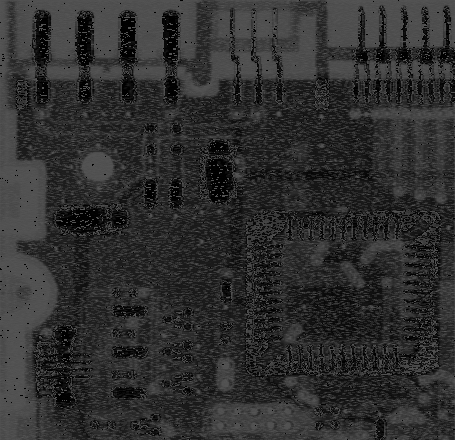

In [ ]:
modified2 = modified_median_filter(image)

cv2_imshow(modified2)

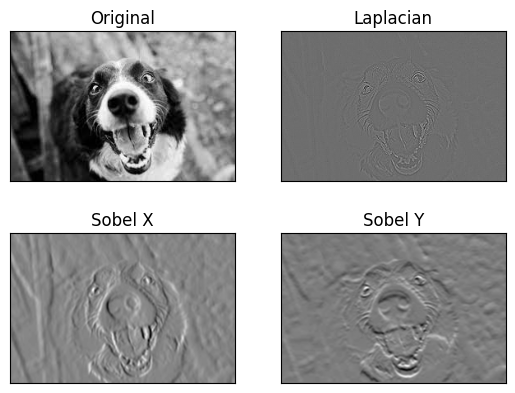

In [ ]:
import numpy as np
import cv2 as cv
from matplotlib import pyplot as plt
img = cv.imread('t3.jpg', cv.IMREAD_GRAYSCALE)
assert img is not None, "file could not be read, check with os.path.exists()"
laplacian = cv.Laplacian(img,cv.CV_64F)
sobelx = cv.Sobel(img,cv.CV_64F,1,0,ksize=5)
sobely = cv.Sobel(img,cv.CV_64F,0,1,ksize=5)
plt.subplot(2,2,1),plt.imshow(img,cmap = 'gray')
plt.title('Original'), plt.xticks([]), plt.yticks([])
plt.subplot(2,2,2),plt.imshow(laplacian,cmap = 'gray')
plt.title('Laplacian'), plt.xticks([]), plt.yticks([])
plt.subplot(2,2,3),plt.imshow(sobelx,cmap = 'gray')
plt.title('Sobel X'), plt.xticks([]), plt.yticks([])
plt.subplot(2,2,4),plt.imshow(sobely,cmap = 'gray')
plt.title('Sobel Y'), plt.xticks([]), plt.yticks([])
plt.show()

In [ ]:
import numpy as np
import cv2 as cv

img = cv.imread('messi.jpg')

In [ ]:
px = img[100, 100]
print(px)

[74 64 64]


In [ ]:
blue = img[100, 100, 0]
print(blue)

74


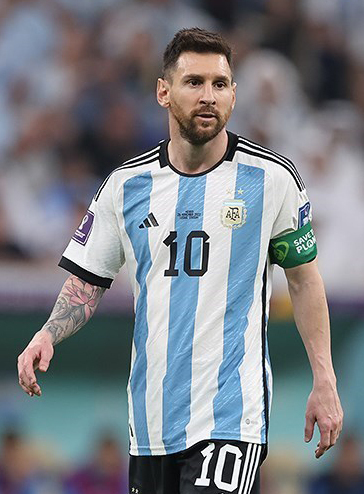

In [ ]:
from google.colab.patches import cv2_imshow
cv2_imshow(img)

In [ ]:
img.shape

(494, 364, 3)

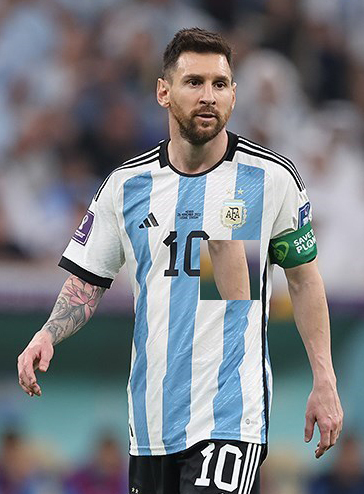

In [ ]:
some_part = img[280:340, 280:340]

img[240:300, 200:260] = some_part

cv2_imshow(img)

In [ ]:
gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
sift = cv.SIFT_create()
kp = sift.detect(gray, None)
img = cv.drawKeypoints(gray, kp, img)

cv.imwrite('/content/sift_keypoints.jpg', img)

True

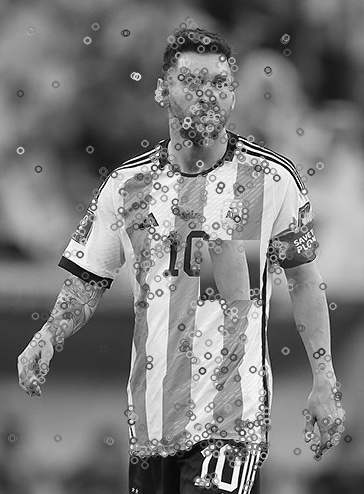

In [ ]:
img2 = cv.imread('sift_keypoints.jpg', 0)

cv2_imshow(img2)

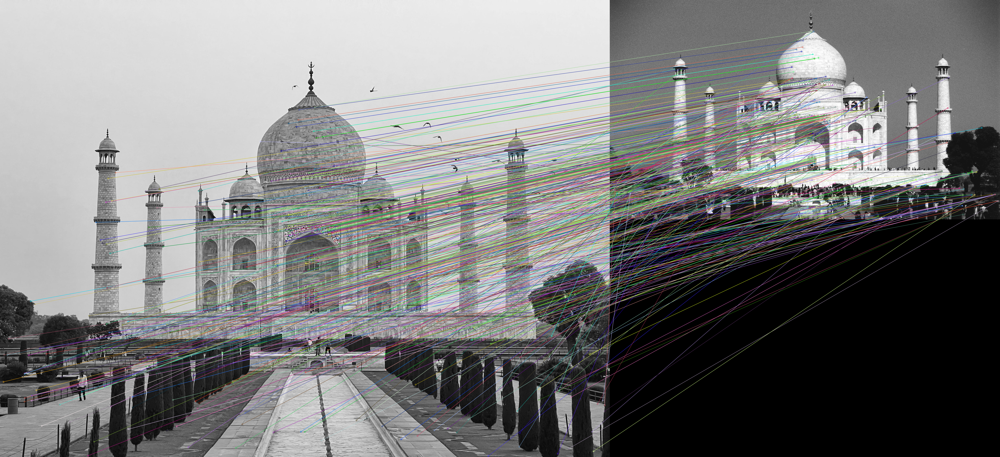

In [5]:
from google.colab.patches import cv2_imshow
import cv2

# Read the two images
image1 = cv2.imread('taj1.jpg', 0)  # Read the first image in grayscale
image2 = cv2.imread('taj2.jpg', 0)  # Read the second image in grayscale

# Detect keypoints and extract descriptors for both images
sift = cv2.SIFT_create()  # Create a SIFT object
keypoints1, descriptors1 = sift.detectAndCompute(image1, None)  # Detect keypoints and compute descriptors for image1
keypoints2, descriptors2 = sift.detectAndCompute(image2, None)  # Detect keypoints and compute descriptors for image2

# Match the keypoints
matcher = cv2.BFMatcher()  # Create a Brute-Force matcher object
matches = matcher.knnMatch(descriptors1, descriptors2, k=2)  # Match keypoints from image1 to image2

# Apply ratio test to filter out good matches
good_matches = []
for m, n in matches:
    if m.distance < 0.75 * n.distance:  # Apply the ratio test
        good_matches.append(m)

# Draw the matched keypoints on a new image
matched_image = cv2.drawMatches(image1, keypoints1, image2, keypoints2, good_matches, None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

# Display the matched image
cv2_imshow(matched_image)
